In [6]:
import os
from glob import glob
import random
import numpy as np
import pandas as pd
import cv2
from PIL import Image
from sklearn.model_selection import train_test_split
from time import time

from albumentations import *

import matplotlib.pyplot as plt
import seaborn as sns

%config InlineBackend.figure_format = 'retina'

In [7]:
os.getcwd()

'/opt/ml/code'

In [24]:
data_dir = '/opt/ml/input/data/train/images/001033_female_Asian_19/mask2.jpg'

In [27]:
img = np.array(Image.open(data_dir))

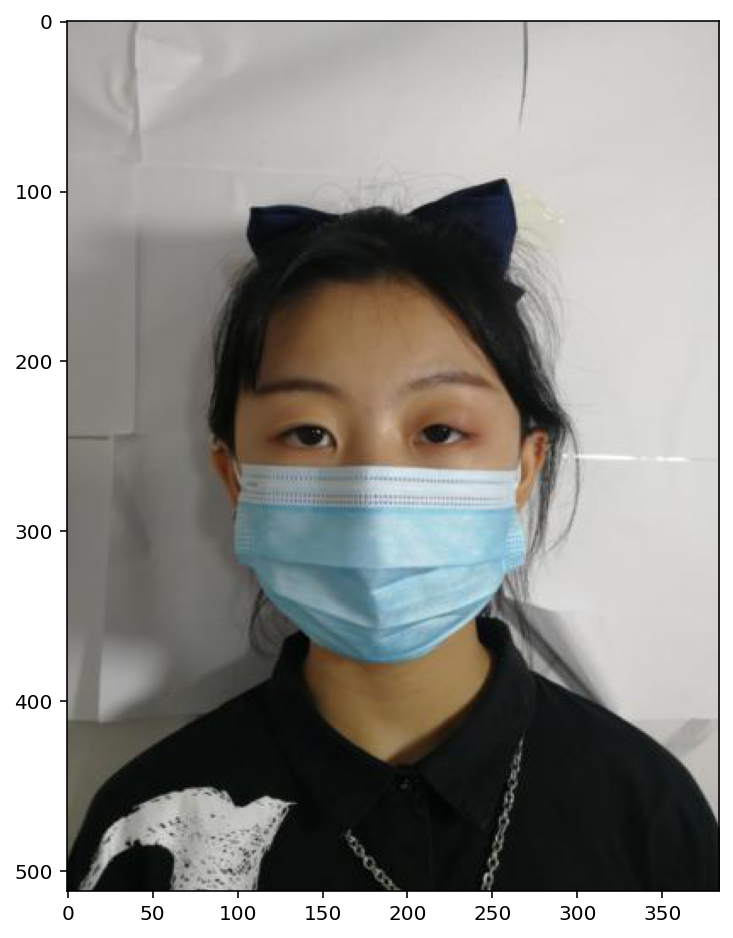

In [28]:
plt.figure(figsize=(16, 8))
plt.imshow(img)

### Flips
- 이미지를 좌우, 상하 반전

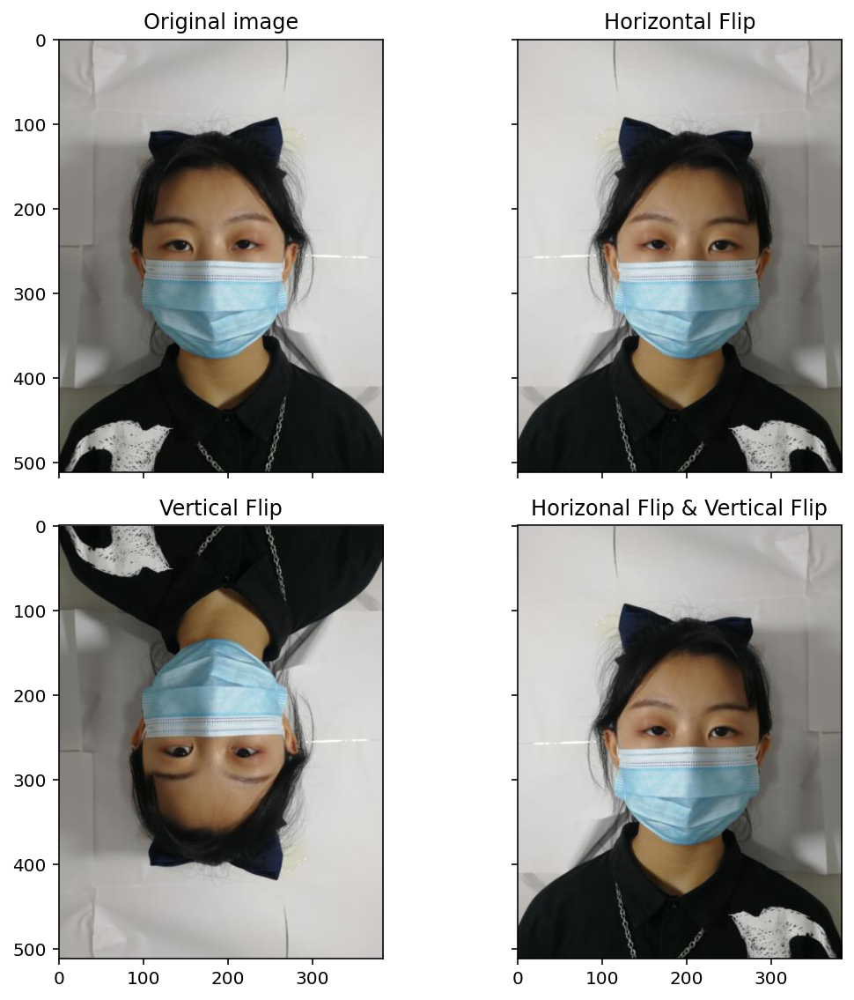

In [43]:
n_rows, n_cols = 2, 2
fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

axes[0][0].imshow(img)
axes[0][0].set_title("Original image")

trfm = Compose([HorizontalFlip(p=1.0),], p=1.0)
axes[0][1].imshow(trfm(image=img)['image'])
axes[0][1].set_title("Horizontal Flip")

tfrm = Compose([VerticalFlip(p=1.0)], p=1.0)
axes[1][0].imshow(tfrm(image=img)['image'])
axes[1][0].set_title("Vertical Flip")

tfrm = Compose([HorizontalFlip(p=1.0), VerticalFlip(p=1.0)], p=1.0)
axes[1][1].imshow(trfm(image=img)['image'])
axes[1][1].set_title("Horizonal Flip & Vertical Flip")

plt.tight_layout()  
# 명시된 여백(padding)에 관한 subplot 파라미터 조절, 입력 없이 사용하면 자동으로 레이아웃 설정

In [44]:
trfm(image=img) # dictionary에 key가 "image"로 저장되어있음

{'image': array([[[202, 198, 197],
         [202, 198, 197],
         [202, 198, 197],
         ...,
         [167, 166, 162],
         [167, 166, 162],
         [167, 166, 162]],
 
        [[202, 198, 197],
         [202, 198, 197],
         [202, 198, 197],
         ...,
         [167, 166, 162],
         [167, 166, 162],
         [167, 166, 162]],
 
        [[202, 198, 197],
         [202, 198, 197],
         [202, 198, 197],
         ...,
         [167, 166, 162],
         [167, 166, 162],
         [167, 166, 162]],
 
        ...,
 
        [[ 17,  21,  20],
         [ 17,  21,  20],
         [ 17,  21,  20],
         ...,
         [  4,   6,   5],
         [  7,   9,   8],
         [  4,   6,   5]],
 
        [[ 17,  21,  20],
         [ 17,  21,  20],
         [ 16,  20,  19],
         ...,
         [  6,   8,   7],
         [  7,   9,   8],
         [  3,   5,   4]],
 
        [[ 17,  21,  20],
         [ 17,  21,  20],
         [ 16,  20,  19],
         ...,
         [  8,  10,

### RamdomCrop
- 이미지를 동일한 크기로 랜덤하게 잘라낸다

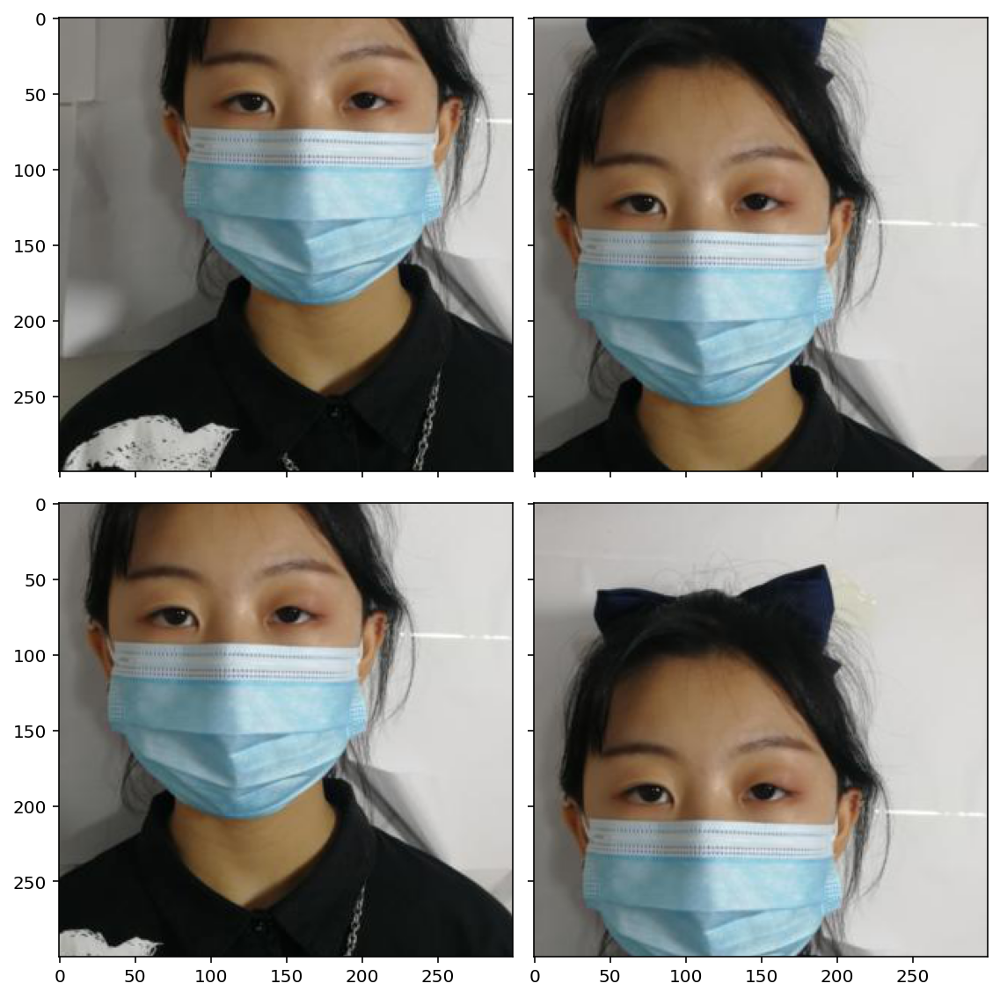

In [42]:
n_rows, n_cols = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

trfm = Compose([RandomCrop(height=300, width=300, p=1.0)], p=1.0)
for i in range(n_rows*n_cols):
    axes[i%n_rows][i//n_cols].imshow(trfm(image=img)['image'])
    
plt.tight_layout()

### Shift, Scale, Rotate
- 이미지를 랜덤하게 Affine Transform

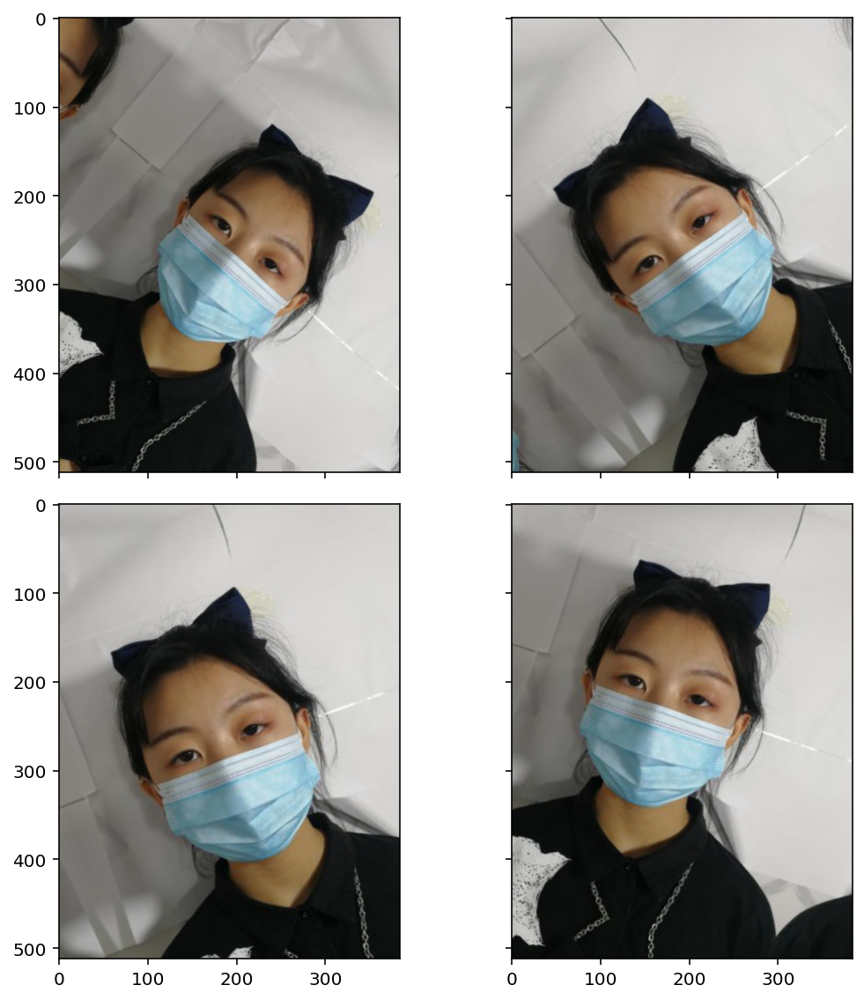

In [50]:
n_rows, n_cols = 2, 2
fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

trfm = Compose([ShiftScaleRotate(p=1.0)], p=1.0)
# trfm = Compose([ShiftScaleRotate(p=1.0),], p=1.0)

for i in range(n_rows*n_cols):
    axes[i%n_rows][i//n_cols].imshow(trfm(image=img)["image"])

plt.tight_layout()

### Brightness, Contrast
- 이미지의 밝기와 대조를 랜덤하게 변화

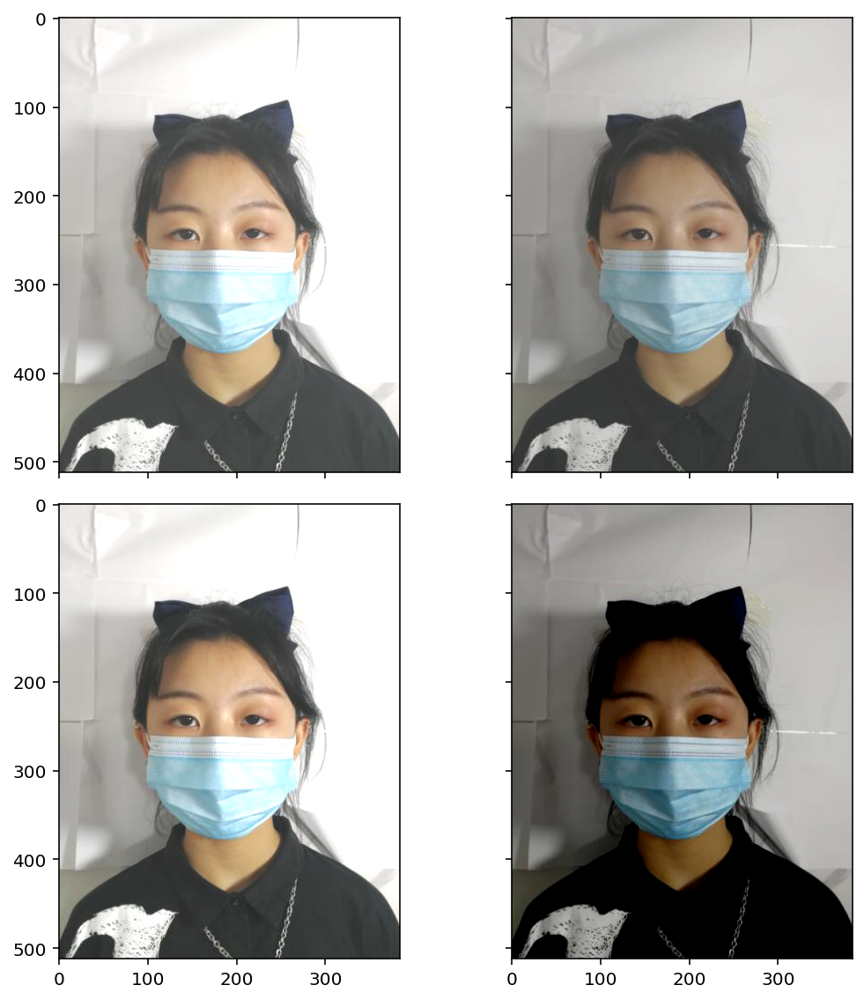

In [53]:
n_rows, n_cols = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

trfm = Compose([RandomBrightnessContrast(brightness_limit=(-0.3, 0.3), contrast_limit=(-0.3, 0.3), p=1.0)], p=1.0)

for i in range(n_rows*n_cols):
    axes[i%n_rows][i//n_cols].imshow(trfm(image=img)["image"])
    
plt.tight_layout()

### Gaussian Noise
- 이미지에 랜덤하게 가우시안 노이즈 씌우기

In [59]:
data_dir = '../input/data/train/images'
img_paths = glob(os.path.join(f"{data_dir}", "*/*"))
random.shuffle(img_paths)

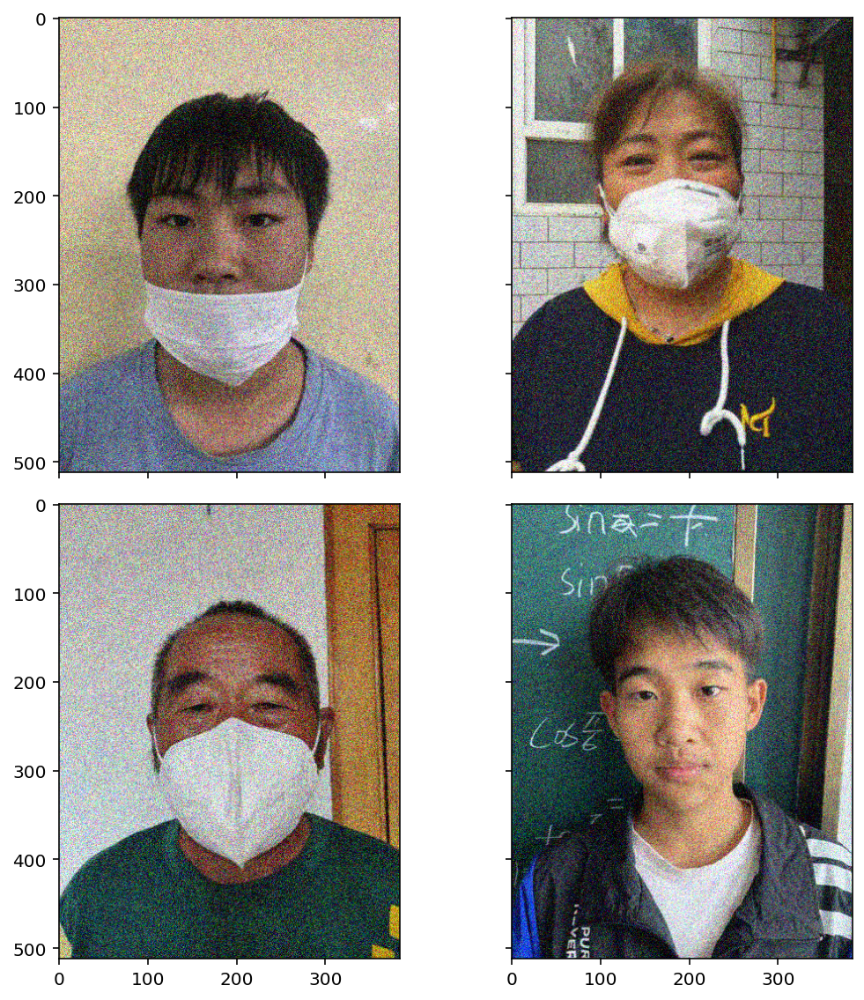

In [61]:
n_cols, n_rows = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

trfm = Compose([GaussNoise(var_limit=(1000, 1600), p=1.0)], p=1.0)

for i in range(n_rows*n_cols):
    _img = np.array(Image.open(img_paths[i]))
    axes[i%n_rows][i//n_cols].imshow(trfm(image=_img)['image'])

plt.tight_layout()

### Put Together
- 위에서의 모든 augmentation 적용하기

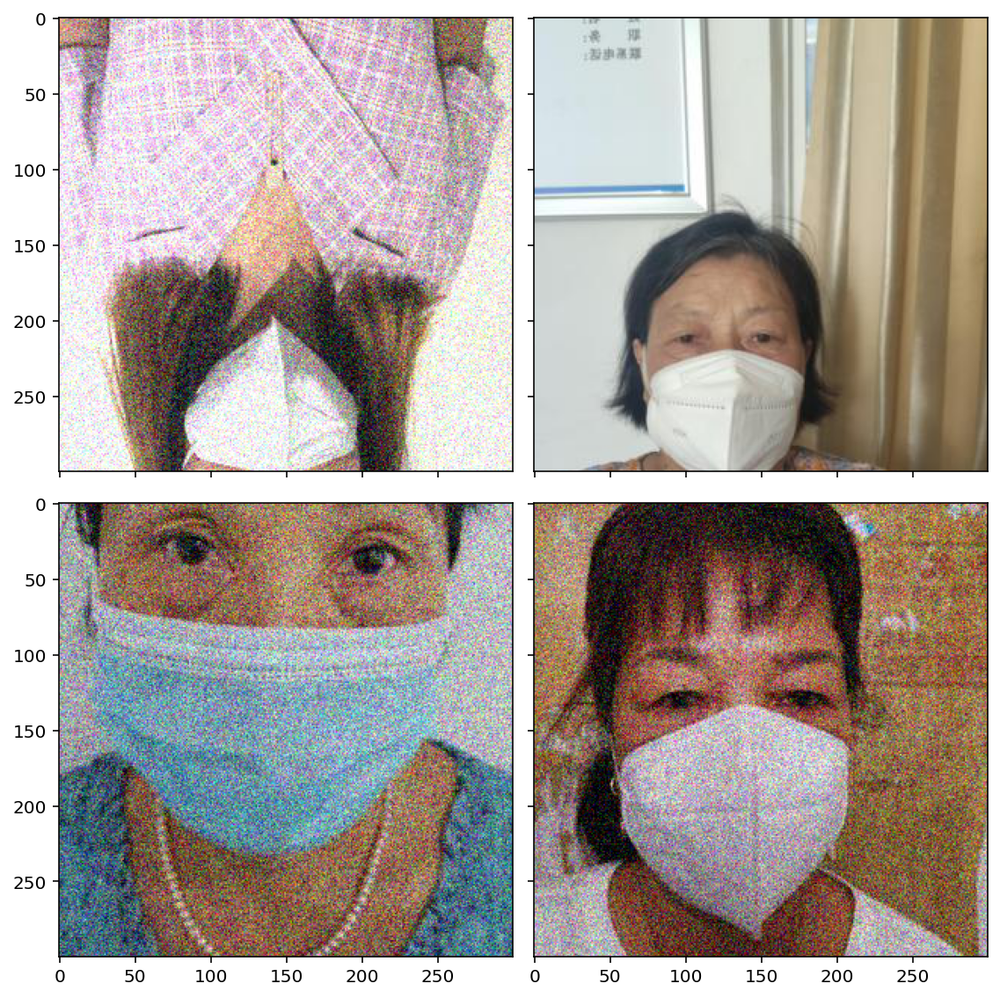

In [70]:
n_rows, n_cols = 2, 2

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(8, 8))

trfm = Compose([RandomCrop(height=300, width=300, p=1.0),
               HorizontalFlip(p=0.5),
               VerticalFlip(p=0.5),
               RandomBrightnessContrast(brightness_limit=(-0.3, 0.3), contrast_limit=(-0.3, 0.3), p=0.5),
               GaussNoise(var_limit=(1000, 1600), p=0.3)], p=1.0)

random.shuffle(img_paths)
for i in range(n_rows*n_cols):
    _img = np.array(Image.open(img_paths[i]))
    axes[i%n_rows][i//n_cols].imshow(trfm(image=_img)['image'])

plt.tight_layout()

### Pixel-level transforms
- 이미지 공간 변화 없이, 픽셀 값 자체만 바꾸는 pixel-level transform 시각화

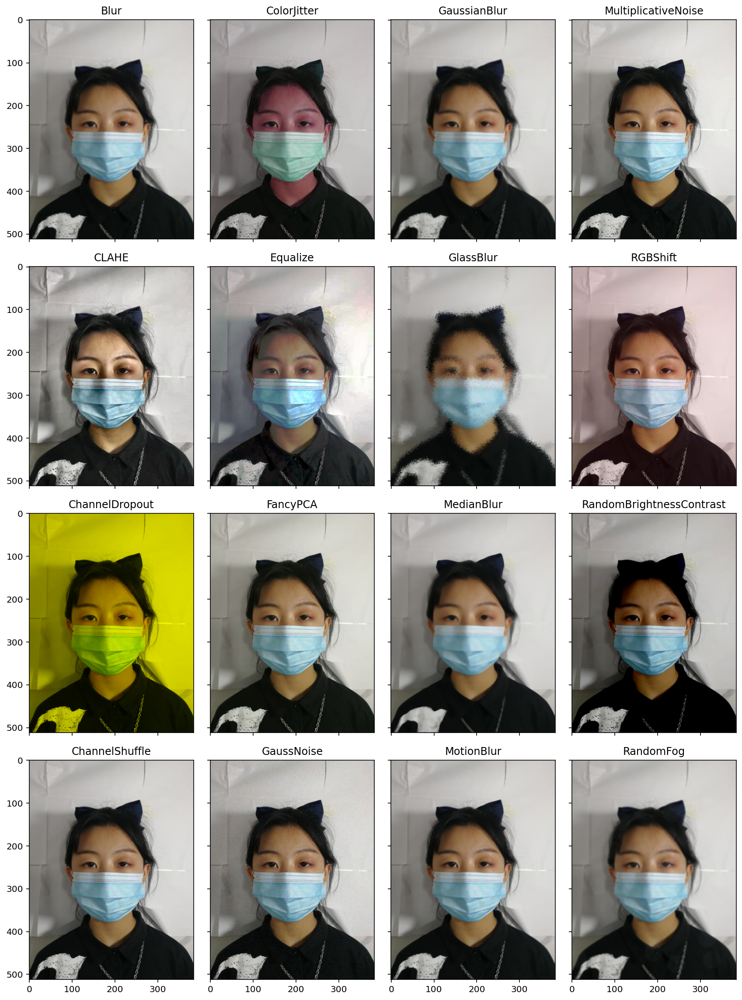

In [71]:
n_rows, n_cols = 4, 4

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(12, 16))

trfm_ls = [Blur,
           CLAHE,
           ChannelDropout,
           ChannelShuffle,
           ColorJitter,
           Equalize,
           FancyPCA,
           GaussNoise,
           GaussianBlur,
           GlassBlur,
           MedianBlur,
           MotionBlur,
           MultiplicativeNoise,
           RGBShift,
           RandomBrightnessContrast,
           RandomFog,
           Solarize]
for i in range(n_rows*n_cols):
    trfm = Compose([Resize(height=512, width=384, p=1.0), trfm_ls[i](p=1.0)])
    axes[i%n_rows][i//n_cols].imshow(trfm(image=img)['image'])
    axes[i%n_rows][i//n_cols].set_title(f'{trfm_ls[i].__name__}')

plt.tight_layout()

### Spatial-level Augmentation
- 공간적으로 이미지 변형

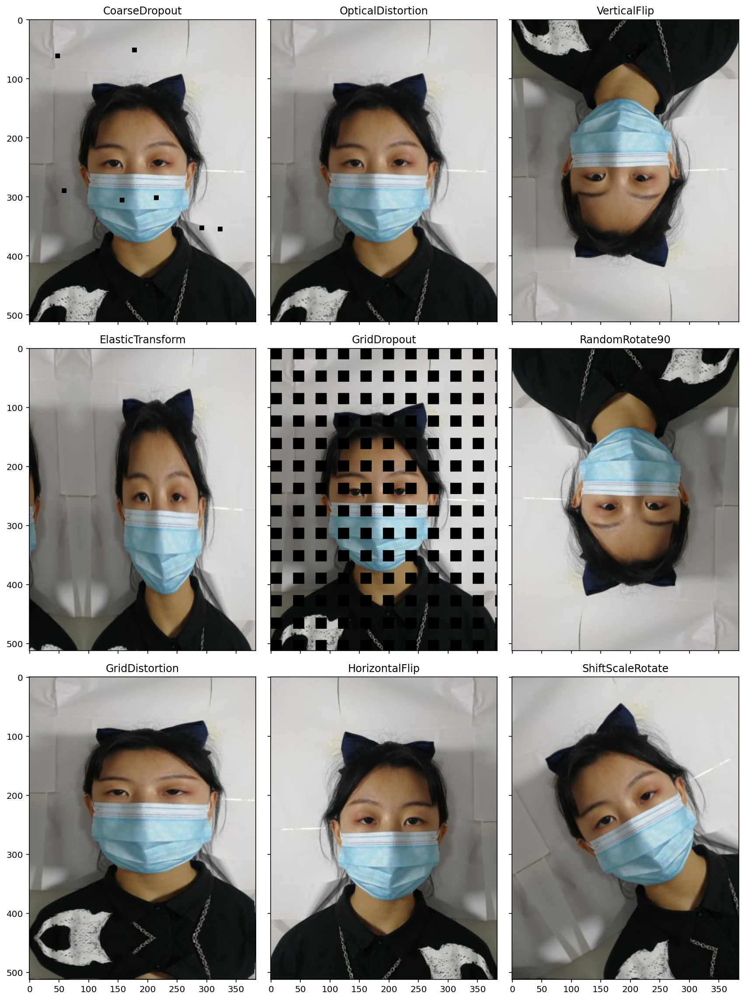

In [72]:
n_rows, n_cols = 3, 3

fig, axes = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(12, 16))

trfm_ls = [CoarseDropout,
           ElasticTransform,
           GridDistortion,
           OpticalDistortion,
           GridDropout,
           HorizontalFlip,
           VerticalFlip,
           RandomRotate90,
           ShiftScaleRotate]
for i in range(n_rows*n_cols):
    trfm = Compose([Resize(height=512, width=384, p=1.0), trfm_ls[i](p=1.0)])
    axes[i%n_rows][i//n_cols].imshow(trfm(image=img)['image'])
    axes[i%n_rows][i//n_cols].set_title(f'{trfm_ls[i].__name__}')

plt.tight_layout()

### Reference
[Albumentations](https://github.com/albumentations-team/albumentations)